# Sorting lines based on the xml files

In [ ]:
simstrimg   # matching
pysimstrimg 

unidecod

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls     xmls.zip


In [1]:
base_dir = '../../edspdf-train/data/publaynet/'

In [2]:
%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

## Model extractor

In [3]:
from edspdf import Pipeline

model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

In [4]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +5

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188


## Visualize a pdf and xml

## XPath

In [5]:
!pip install Unidecode
!pip install fuzzysearch

In [6]:
!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [7]:
import io
import pydotplus
import elementpath
from lxml import etree
from copy import deepcopy
from graphviz import Source
from IPython.display import display, Image

### Fonctions d'affichage

In [8]:
xslt_dir = '../../edspdf-train/data/xslt/'

In [9]:

def printXML(element):
    # print(isinstance(element, etree._ElementTree))
    t = element if isinstance(element, etree._ElementTree) else etree.ElementTree(element)
    # t=etree.ElementTree(element)
    str=etree.tostring(t, pretty_print=True, encoding='unicode')
    print(str)
    # return str
 
        
def printXPath(xmltree,xp):
    # r=xmltree.xpath(xp)
    try:
        r=elementpath.select(xmltree,xp)
        print(f'Lenght {len(r)}')
        for x in r:
            printXML(x)
    except:
        print(f"error in expression ({xp}) or inputfile")
        

def displayXPath(xmltree,xp,pngfile="reponse"):
    # r=xmltree.xpath(xp)
    r=elementpath.select(xmltree,xp)
    reponse=etree.Element("reponse")
    for x in r:
        reponse.append(deepcopy(x))
    displayXMLInline(reponse)

    
def displayXML(t,pngfile="xpath"):
    f_xslt = open(f"{xslt_dir}xml2dot.xslt","r")
    xslt=etree.parse(f_xslt)
    transform = etree.XSLT(xslt)
    s_dot=transform(t)
    try:
        s=Source(str(s_dot),filename="gendata/"+pngfile+".dot", format="png")
    except:
        print("install graphviz")
        print(etree.tostring(t, pretty_print=True, encoding='unicode'))
    s.view()
    
def displayXMLInline(t):
    f_xslt = open(f"{xslt_dir}xml2dot.xslt","r")
    xslt=etree.parse(f_xslt)
    transform = etree.XSLT(xslt)
    s_dot=str(transform(t))
    # print(s_dot)
    # with io.StringIO(s_dot) as f:
    #    a=nx.nx_pydot.read_dot(f)
    try:
        dg = pydotplus.graph_from_dot_data(s_dot)
        png = dg.create_png()
        display(Image(png))
    except:
        print("install graphviz")
        print(etree.tostring(t, pretty_print=True, encoding='unicode'))
    # print(s_dot)
    # return s_dot

In [10]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1087887/

1477-9560-3-5-1.gif 1477-9560-3-5-1.jpg 1477-9560-3-5.nxml  1477-9560-3-5.pdf


In [11]:
from pathlib import Path

def get_paths(file_dir):

    file_dir = Path(file_dir)
    xml_path = next(file_dir.glob("*.nxml"))
    pdf_path = next(file_dir.glob("*.pdf"))
    
    return pdf_path, xml_path


### Example 1

In [37]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1087887/

1477-9560-3-5-1.gif 1477-9560-3-5-1.jpg 1477-9560-3-5.nxml  1477-9560-3-5.pdf


In [12]:
# file_dir = base_dir + 'xmls/PMC1087887'
# pdf_path, xml_path = get_paths(file_dir = file_dir)
# print(f'xml path: {xml_path}\npdf path: {pdf_path}')


#### Show annotations

In [10]:
# from edspdf.structures import Box, PDFDoc
# from edspdf.visualization.annotations import show_annotations

# # Read PDF
# pdf = pdf_path.read_bytes()
# doc: PDFDoc = model.get_pipe("extractor")(pdf)

# # pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

#### Display XML

In [11]:
# Read XML
# xml = open(xml_path, 'rb')
# tree = etree.parse(xml)

# displayXMLInline(tree)

### Example 2

In [12]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1247188/

ehp0112-000959.nxml  ehp0112-000959f1.jpg ehp0112-000959f3.gif
ehp0112-000959.pdf   ehp0112-000959f2.gif ehp0112-000959f3.jpg
ehp0112-000959f1.gif ehp0112-000959f2.jpg


In [13]:
file_dir = base_dir + 'xmls/PMC1247188'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247188/ehp0112-000959.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247188/ehp0112-000959.pdf


#### Show annotations

In [14]:
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

#### Display XML

In [83]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15198915</article-id>
      <article-id pub-id-type="pmc">1247188</article-id>
    

In [16]:
# qfront='//front//title-group/* | //front//p | //front//corresp | //front//aff'
# qbody='//body//title | //body//p'
# printXPath(tree,qbody)


In [17]:
# # tous les textes
# q0='//*/title | //*/p'
# qfront='//*/front/title | //*/front/p'
# qbody='//*/body/title | //*/body/p'
# printXPath(tree,q0)

# try:
#     r=elementpath.select(tree, q0)
#     for i,x in enumerate(r):
#         if i==4:
#             p5 = x
#         print(i, ':', "".join(x.itertext()))
#         # printXML(x)
# except:
#     print(f"error in expression ({q0}) or inputfile")

In [18]:
# def getTextNodes(tree, q):
    
#     # def node():
#     r=elementpath.select(tree, q)
#     for x in r:
#         # print(i, ':', x.text)
#         if x.text :
#             yield x
#         else:
#             continue
    
#     # return node

In [82]:
from fuzzysearch import find_near_matches
from unidecode import unidecode
from tqdm import tqdm

# mapped text boxes
for i,tb in enumerate(doc.content_boxes):
    tb.id = i # text box id
map_tboxes = {tb.id: tb for tb in doc.content_boxes}

print('Nb text boxes:',len(map_tboxes))
def tb_match_(target_text, source_text, d=0, v=False):
    len_target_text = len(target_text)
    if len_target_text < 1: # text box that have no text
        return False
    
    pdmax = 0.2  if len_target_text<=20 else (\
            0.15 if len_target_text<=40 else \
            0.1)
    dmax = d + int(pdmax * len_target_text)
    
    #match
    ret = find_near_matches(target_text, source_text, max_l_dist=dmax)
    if v:
        print(f'Block text `{target_text}`')
        print(f'Node text `{source_text}`')
        print(ret)
    
    return True if len(ret) > 0 else False
    
def get_matches(nodes, text_boxes):
    dict_page_text_boxes = {}
    for tb in text_boxes:
        if tb.page_num not in dict_page_text_boxes:
            dict_page_text_boxes[tb.page_num] = []
        dict_page_text_boxes[tb.page_num].append(tb)
    
    dict_page_blocks = {}
    for num_page in dict_page_text_boxes:
        page_text_boxes = dict_page_text_boxes[num_page]
        dict_blocks = {} # {inode: blocks}
        
        for tb in page_text_boxes:
            for inode,node in enumerate(nodes):
                target_text = unidecode(tb.text)
                source_text = " ".join(node.itertext())
                ret = tb_match_(target_text, source_text)
                if not ret:    # no match
                    continue
                if inode not in dict_blocks:
                    dict_blocks[inode] = (node,[[tb.text,[tb]]]) # list[list[tb]]
                    continue
                
                _,blocks = dict_blocks[inode]
                text,block = False,False # find_block(tb, blocks)
                for t,b in blocks:
                    tb1, tb2 = (b[-1],tb) if (b[-1].x0 <= tb.x0) else (tb,b[-1])
                    if (tb2.x0 <= tb1.x1):
                        text,block = t,b
                        break

                if block:
                    # test if block + [tb] matches with the node
                    # if so append tb to block else continue (just one 
                    # corresponding block for each tb)
                    target_text = text + tb.text
                    target_text = unidecode(target_text)
                    ret = tb_match_(target_text, source_text, d=0, v=(inode==7 and num_page==0))
                    if ret:
                        text += tb.text
                        block.append(tb)
                    else:
                        continue
                else: # if no corresponding then create a new block and append it to the list of blocks
                    new_text,new_block = tb.text,[tb]
                    blocks.append((new_text,new_block))
        #page
        dict_page_blocks[num_page] = dict_blocks
    return dict_page_blocks

def xget_matches(nodes, text_boxes, nmax=None):
    l_matches = []
    for node in nodes:
        node_matches = {}
        source_text = " ".join(node.itertext())
        end = False # end of the current node
        
        for tb in text_boxes:
            target_text = unidecode(tb.text)
            len_target_text = len(target_text)
            if len_target_text < 1: # text box that have no text
                continue
            
            pdmax = 0.2  if len_target_text<=20 else (\
                    0.15 if len_target_text<=40 else \
                    0.1)
            dmax = int(pdmax * len_target_text)
            
            #match
            tb_matches = find_near_matches(target_text, source_text, max_l_dist=dmax)
            if len(tb_matches) > 0: # node text matches with text box text
                if tb.page_num not in node_matches:
                    node_matches[tb.page_num] = []
                node_matches[tb.page_num].append((tb,tb_matches))
                
                if tb.id in map_tboxes: # debug
                    del(map_tboxes[tb.id])
            
            # end of node # problem just first tb.text = 'Canada' for evry node.text == 'Canada'
            # for m in tb_matches:
            #     if len(source_text) <= m.end :
            #         end = True
            #         break
            # if end:
            #     break
        l_matches.append((node, node_matches))
        
        # just nmax nodes
        if nmax is not None:
            nmax -= 1
            if nmax <= 0:
                break
        
    return l_matches

# q0='//*/title | //*/p'
# nodes = tqdm(getTextNodes(tree, q0), mininterval=1)
# l_matches = get_matches(nodes, doc.content_boxes)


Nb text boxes: 2618


#### Font, Body and tables text nodes

In [85]:
for tb in doc.content_boxes:
    tb.rank = None

In [24]:
def get_front_nodes():
    qfront='//front//title-group/* | //front//p | //front//corresp | //front//aff | //front//contrib-group'
    r = elementpath.select(tree, qfront)

    for i,node in enumerate(r):
        if node.tag == 'contrib-group':
            contrib_group = etree.Element('contrib-groups')
            
            for icontrib,contrib in enumerate(node):
                for icontrib_child,contrib_child in enumerate(contrib):
                    # print(f'icontrib_child {icontrib_child} tag {contrib_child.tag}')
                    if contrib_child.tag != 'name':
                        contrib_group.append(contrib_child)
                        continue
                    
                    new_name = etree.Element('new-name')
                    surname = None
                    given_names = None
                    for (i2,subname) in enumerate(contrib_child):
                        if subname.tag == 'surname':
                            surname = i2,subname
                        if subname.tag == 'given-names':
                            given_names = i2,subname
                        if surname is not None and given_names is not None:
                            break
                    if surname is not None and given_names is not None:
                        if surname[0]< given_names[0]:
                            new_name.append(given_names[1])
                            new_name.append(surname[1])
                        else:
                            new_name.append(surname[1])
                            new_name.append(given_names[1])
                    # printXML(new_name)
                    contrib_group.append(new_name)
            # printXML(contrib_group)
            r[i] = contrib_group

    # aff
    affs = etree.Element('affs')
    affs_ind = []
    for i,node in enumerate(r):
        if node.tag == 'aff':
            affs_ind.append(i)
            # affs.append(deepcopy(node))
            affs.append(node)
    r[affs_ind[0]] = affs
    r = [n for i,n in enumerate(r) if i not in affs_ind[1:]]
    
    return r
        
front_nodes = get_front_nodes()
front_nodes = tqdm(front_nodes, mininterval=1)
print(f'\n\nNb nodes {len(front_nodes)}')
for node in front_nodes:
    printXML(node)

100%|██████████| 8/8 [00:00<00:00, 2612.66it/s]



Nb nodes 8
<article-title xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">Potential for Increased Human Foodborne Exposure to PCDD/F When Recycling Sewage Sludge on Agricultural Land</article-title>

<contrib-groups>
  <new-name>
    <given-names>Karen</given-names>
    <surname>Rideout</surname>
  </new-name>
  <xref ref-type="aff" rid="af1-ehp0112-000959">
    <sup>1</sup>
  </xref>
  <xref ref-type="aff" rid="af2-ehp0112-000959">
    <sup>2</sup>
  </xref>
  <new-name>
    <given-names>Kay</given-names>
    <surname>Teschke</surname>
  </new-name>
  <xref ref-type="aff" rid="af1-ehp0112-000959">
    <sup>1</sup>
  </xref>
  <xref ref-type="aff" rid="af3-ehp0112-000959">
    <sup>3</sup>
  </xref>
</contrib-groups>

<affs>
  <aff id="af1-ehp0112-000959"><sup>1</sup>School of Occupational and Environmental Hygiene</aff>
  <aff id="af2-ehp0112-000959"><sup>2</sup>Institute for Resources, Environment and Sustainability</aff>
  <aff id="af3-ehp

In [84]:
dict_page_blocks = get_matches(front_nodes, doc.content_boxes)

Block text `Sewage sludge from municipal wastewater treatment is used in agriculture as a nutrient source andto aid in moisture retention. To examine the potential impact of sludge-amended soil on expo-`
Node text `Sewage sludge from municipal wastewater treatment is used in agriculture as a nutrient source and to aid in moisture retention. To examine the potential impact of sludge-amended soil on exposures to polychlorinated dibenzo- p -dioxins and dibenzofurans (PCDD/Fs) from plant and animal foods, we conducted a review of published empirical data from international sources. Levels of PCDD/F in municipal sewage sludge ranged from 0.0005 to 8,300 pg toxic equivalents (TEQ)/g. Background levels in soil ranged from 0.003 to 186 pg TEQ/g. In sludge-amended soils, levels of PCDD/F ranged from 1.4 to 15 pg TEQ/g. Studies that measured levels before and after sludge treatment showed an increase in soil concentration after treatment. Relationships between PCDD/F levels in soil and resulting

In [65]:
# debug

tt = 'Sewage sludge from municipal wastewater treatment is used in agriculture as a nutrient source and' + \
     'to aid in moisture retention. To examine the potential impact of sludge-amended soil on expo-'

st = 'Sewage sludge from municipal wastewater treatment is used in agriculture as a nutrient source and to aid in moisture retention. To examine the potential impact of sludge-amended soil on exposures to polychlorinated dibenzo- p -dioxins and dibenzofurans (PCDD/Fs) from plant and animal foods, we conducted a review of published empirical data from international sources. Levels of PCDD/F in municipal sewage sludge ranged from 0.0005 to 8,300 pg toxic equivalents (TEQ)/g. Background levels in soil ranged from 0.003 to 186 pg TEQ/g. In sludge-amended soils, levels of PCDD/F ranged from 1.4 to 15 pg TEQ/g. Studies that measured levels before and after sludge treatment showed an increase in soil concentration after treatment. Relationships between PCDD/F levels in soil and resulting concentrations in plants were very weakly positive for unpeeled root crops, leafy vegetables, tree fruits, hay, and herbs. Somewhat stronger relationships were observed for plants of the cucumber family. In all cases, large increases in soil concentration were required to achieve a measurable increase in plant contamination. A considerably stronger positive relationship was observed between PCDD/F in feed and resulting levels in cattle tissue, suggesting bioaccumulation. Although PCDD/Fs are excreted in milk, no association was found between feed contamination and levels of PCDD/Fs measured in milk. There is a paucity of realistic data describing the potential for entry of PCDD/Fs into the food supply via sewage sludge. Currently available data suggest that sewage sludge application to land used for most crops would not increase human exposure. However, the use of sludge on land used to graze animals appears likely to result in increased human exposure to PCDD/F.'
tb_match_(tt, st, d=2)

tt2 = tt + 'Contaminants may adhere directly to plant'
tb_match_(tt2, st, d=2)

[Match(start=0, end=191, dist=2, matched='Sewage sludge from municipal wastewater treatment is used in agriculture as a nutrient source and to aid in moisture retention. To examine the potential impact of sludge-amended soil on expos')]
[]


False

In [86]:

print(f'Nb pages {len(dict_page_blocks)}')
for page_num in dict_page_blocks:
    dict_blocks = dict_page_blocks[page_num]
    print(f'Page {page_num} nb nodes {len(dict_blocks)}')

    for inode in dict_blocks:
        node,blocks = dict_blocks[inode]
        
        node_text = " ".join(node.itertext())
        print(f'  Node {inode}\n    Nb blocks {len(blocks)}\n    Text: `{node_text}`')

        for iblock,(text,block) in enumerate(blocks):
            print(f'    block {iblock}\n      Nb text boxes {len(block)}\n      Text: `{text}`')
            for rank,tb in enumerate(block):
                print(f'        `{tb.text}`')
                tb.rank = f'{inode}-{rank}'

Nb pages 11
Page 0 nb nodes 7
  Node 0
    Nb blocks 1
    Text: `Potential for Increased Human Foodborne Exposure to PCDD/F When Recycling Sewage Sludge on Agricultural Land`
    block 0
      Nb text boxes 2
      Text: `Potential for Increased Human Foodborne Exposure to PCDD/F When`
        `Potential for Increased Human Foodborne Exposure to PCDD/F When`
        `Recycling Sewage Sludge on Agricultural Land`
  Node 2
    Nb blocks 1
    Text: `1 School of Occupational and Environmental Hygiene 2 Institute for Resources, Environment and Sustainability 3 Department of Health Care and Epidemiology, University of British Columbia, Vancouver, British Columbia, Canada`
    block 0
      Nb text boxes 2
      Text: `1School of Occupational and Environmental Hygiene, 2Institute for Resources, Environment and Sustainability, and 3Department of`
        `1School of Occupational and Environmental Hygiene, 2Institute for Resources, Environment and Sustainability, and 3Department of`
        `

In [251]:
# front 


# qfront='//front//title-group/* | //front//p | //front//corresp | //front//aff'

# Pretraitement avant get_matches

front_matches = get_matches(front_nodes, doc.content_boxes)

print(f'Nb nodes {len(front_matches)}')
front_boxes = []
for it, (node, page_matches) in enumerate(front_matches): # for each node
    source_text = " ".join(node.itertext())
    print(f'Node {it} \n    node tag: {node.tag} || itertext: --{source_text}--')
    if it == 1: continue

    end = False
    for page_num in page_matches:    # for each page (matching text boxes per page)
        page = page_matches[page_num]
        print(f'    Page {page_num} nb matches {len(page)}')
        
        # merge sequential
        i2 = 0
        text = ''
        page_tb = []
        for tb,_ in page: # for each (matching) tb on this page
            i2 += 1
            text = text + tb.text 
            pdmax = 0.2  if len(text)<=20 else (\
                    0.15 if len(text)<=40 else \
                    0.1)
            dmax = 2*len(page_tb) + int(pdmax * len(text))
            fms = find_near_matches(text, source_text, max_l_dist=dmax)
            
            print(f'      i2 {i2} text: {text}')
            if fms:
                page_tb.append(tb)
                print(f'      Match<>{text}<> {page_tb}')
                for fm in fms:
                    if fm.end >= len(source_text)-2 and fm.start <= 2:
                        end = True
                        break
                if end:
                    print(f'      *END Match<>{text}<> {page_tb}')
                    break
            else:
                print(f'      NO Match<>{text}<> {[page_tb]+[tb]}')
                text = ''
                page_tb = [tb]
            
            # tb.rank = rank
            # tb.color = "yellow"
            # tb.bg_color = "black"
        # print(f'      Match<>{text}<> {page_tb}')
        if end:
            break
        
        if page_num > 2: break
    # break # just one node

# merged_front_boxes = merge_boxes(front_boxes)

100%|██████████| 8/8 [00:01<00:00,  7.54it/s]


Nb nodes 8
Node 0 
    node tag: article-title || itertext: --Potential for Increased Human Foodborne Exposure to PCDD/F When Recycling Sewage Sludge on Agricultural Land--
    Page 0 nb matches 2
      i2 1 text: Potential for Increased Human Foodborne Exposure to PCDD/F When
      Match<>Potential for Increased Human Foodborne Exposure to PCDD/F When<> [TextBox(x0=0.07761437908496732, x1=0.8312078431372554, y0=0.07995113636363649, y1=0.09762790404040411, label=None, page_num=0, text='Potential for Increased Human Foodborne Exposure to PCDD/F When', props=[TextProperties(italic=False, bold=True, begin=0, end=63, fontname='BDMGBE+Univers-Bold')])]
      i2 2 text: Potential for Increased Human Foodborne Exposure to PCDD/F WhenRecycling Sewage Sludge on Agricultural Land
      Match<>Potential for Increased Human Foodborne Exposure to PCDD/F WhenRecycling Sewage Sludge on Agricultural Land<> [TextBox(x0=0.07761437908496732, x1=0.8312078431372554, y0=0.07995113636363649, y1=0.09762790404

KeyboardInterrupt: 

In [234]:
set([b.label for b in merged_front_boxes])

{0, 1, 2, 3, 4, 5, 6, 7}

In [221]:
# body 


qbody='//body//title | //body//p'
body_nodes = tqdm(elementpath.select(tree, qbody), mininterval=1)
body_matches = get_matches(body_nodes, doc.content_boxes)

print(f'Nb nodes {len(body_matches)}')
for it, (node, matches) in enumerate(body_matches):
    print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
    for rank, (tb,matches_tb) in enumerate(matches):
        tb.rank = rank
        tb.color = "black"
        tb.bg_color = "cyan"
        # print(f'    page {tb.page_num} --{tb.text}-- \t{matches_tb}')
    
    # if it >= 3: break

100%|██████████| 69/69 [00:13<00:00,  5.29it/s]

Nb nodes 69
0 
    nb matches 204 || node tag: p || itertext: --In populations not industrially exposed to polychlorinated dibenzo-p-dioxins and dibenzofurans (PCDD/Fs), diet is responsible for virtually all (~ 98%) human exposure to these compounds (Pohl et al. 1995; Travis and Hattemer-Frey 1987). PCDD/Fs are common contaminants in municipal sewage sludge; thus, it is important to consider the risk of increased exposure to these contaminants if sewage sludge is to be applied to agricultural lands. There is currently much interest in agricultural use of sewage sludge to reap its benefits as fertilizer, as an aid in moisture retention, and to provide an alternative to incineration or landfills for disposal. The term “sewage sludge” is used here to refer to the solid by-product of municipal sewage or wastewater treatment processes. It includes but is not limited to “biosolids,” a term that usually refers to a stabilized product that has been treated to reduce pathogen content and vector

In [104]:
# tables 
from copy import deepcopy

qtables='//table-wrap | //table-wrap'
qtable='//label | //caption | //th | //td | //fn'

tables=elementpath.select(tree, qtables)
ltables_matches = []

for table_tree in tables:
    table_nodes = elementpath.select(table_tree, qtable)
    
    # Merging label and caption
    label = None
    caption = None
    for ind,node in enumerate(table_nodes):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            table_nodes[label[0]] = lc
            table_nodes = table_nodes[:caption[0]] + table_nodes[1+caption[0]:]
            break
    
    table_nodes = tqdm(table_nodes, mininterval=1)
    table_matches = get_matches(table_nodes, doc.content_boxes)
    ltables_matches.append(table_matches)
    
for ltab in ltables_matches:
    for it, (node, matches) in enumerate(ltab):
        print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
        tx = []
        for rank, (tb,matches_tb) in enumerate(matches):
            tb.rank = it # str(it) + '-' + str(rank)
            tb.color = "red"
            tb.bg_color = "white"
            tx.append(tb.text)
            
            # if tb.text == 'Canada':
            #     print(it, tb)
            # print(f'    page {tb.page_num} --{tb.text}-- \t{matches_tb}')
        print('    '," -|- ".join(tx))
        
        # if it >= 3: break

100%|██████████| 330/330 [00:17<00:00, 19.25it/s]

0 
    nb matches 140 || node tag: label_caption || itertext: --Table 1Concentrations of PCDD/F in sewage sludge, sorted by country and year.--
     Table 1. Concentrations of PCDD/F in sewage sludge, sorted by country and year. -|- Country -|- n -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- With sewage sludge -|- PCDD/F -|- g -|- / -|- T -|- g -|- n -|- o -|- i -|- t -|- a -|- r -|- t -|- n -|- e -|- c -|- n -|- o -|- C -|- Country -|- n -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- PCDD/F -|- PCDD/F -|- n -|- 1 -|- 1 -|- 1 -|- 1 -|- PCDD/F -|- n -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- 1 -|- PCDD/F -|- n -|- 1 -|- 1 -|- 1 -|- 1 -|- w -|- d -|- g -|- / -|- T -|- g -|- n -|- o -|- i -|- t -|- a -|- r -|- t -|- n -|- e -|- c -|- n -|- o -|- c -|- F -|- / -|- D -|- D -|- C -|- P -|- d -|- o -|- o -|- F -|- PCDD/F -|- n -|- n -|- PCDD/F -|- 1 -|- w -|- d -|- g -|- / -|- T -|- g -|- n -|- o -|- i -|- t -|- a -|- r

#### Ranked text boxes

In [223]:
doc.content_boxes[:10]

[TextBox(x0=0.6983624183006536, x1=0.9207556372549021, y0=0.031540404040404035, y1=0.057323358585858686, label=None, page_num=0, text='Research | Review', props=[TextProperties(italic=False, bold=False, begin=0, end=8, fontname='BDMFNP+FrizQuadrataITCbyBT-Roman'), TextProperties(italic=False, bold=False, begin=9, end=10, fontname='BDMFPC+Frutiger-Light'), TextProperties(italic=False, bold=True, begin=11, end=17, fontname='BDMGEJ+Frutiger-Bold')]),
 TextBox(x0=0.07761437908496732, x1=0.8312078431372554, y0=0.07995113636363649, y1=0.09762790404040411, label=None, page_num=0, text='Potential for Increased Human Foodborne Exposure to PCDD/F When', props=[TextProperties(italic=False, bold=True, begin=0, end=63, fontname='BDMGBE+Univers-Bold')]),
 TextBox(x0=0.07761437908496732, x1=0.5872807189542486, y0=0.09889002525252533, y1=0.11656679292929295, label=None, page_num=0, text='Recycling Sewage Sludge on Agricultural Land', props=[TextProperties(italic=False, bold=True, begin=0, end=44, font

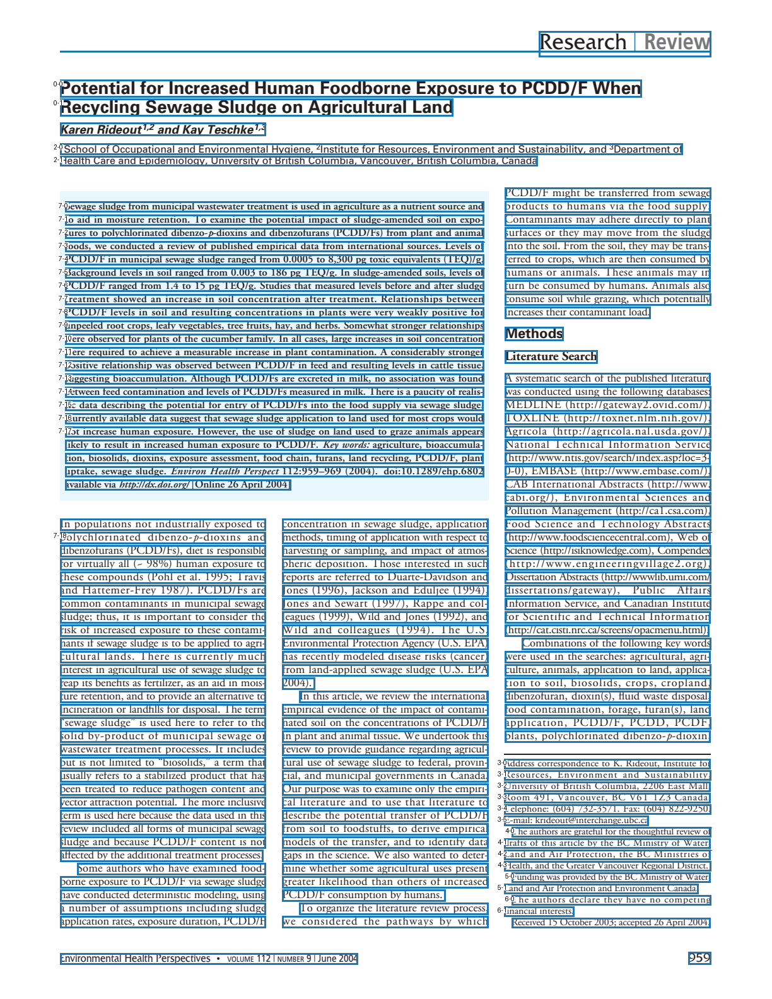

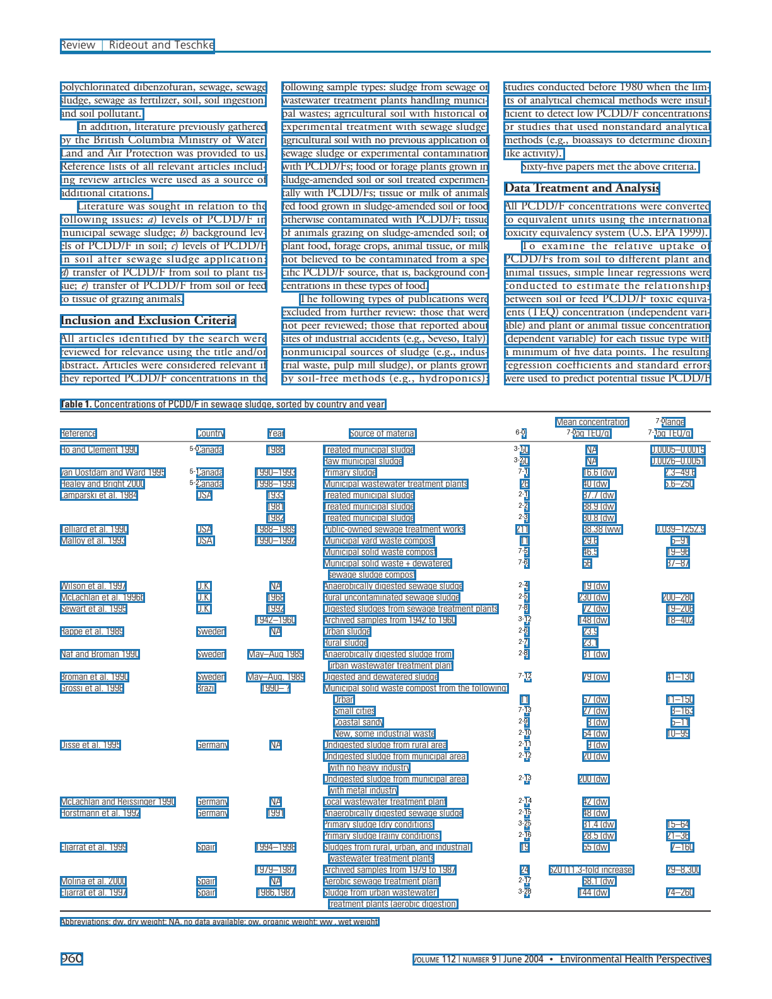

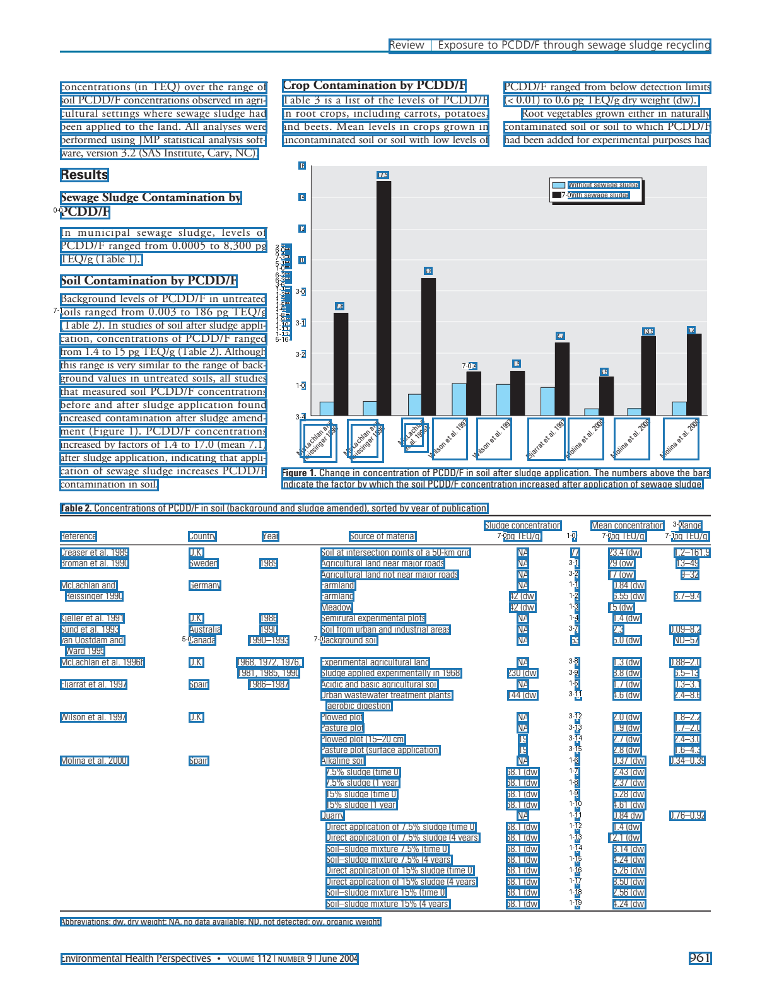

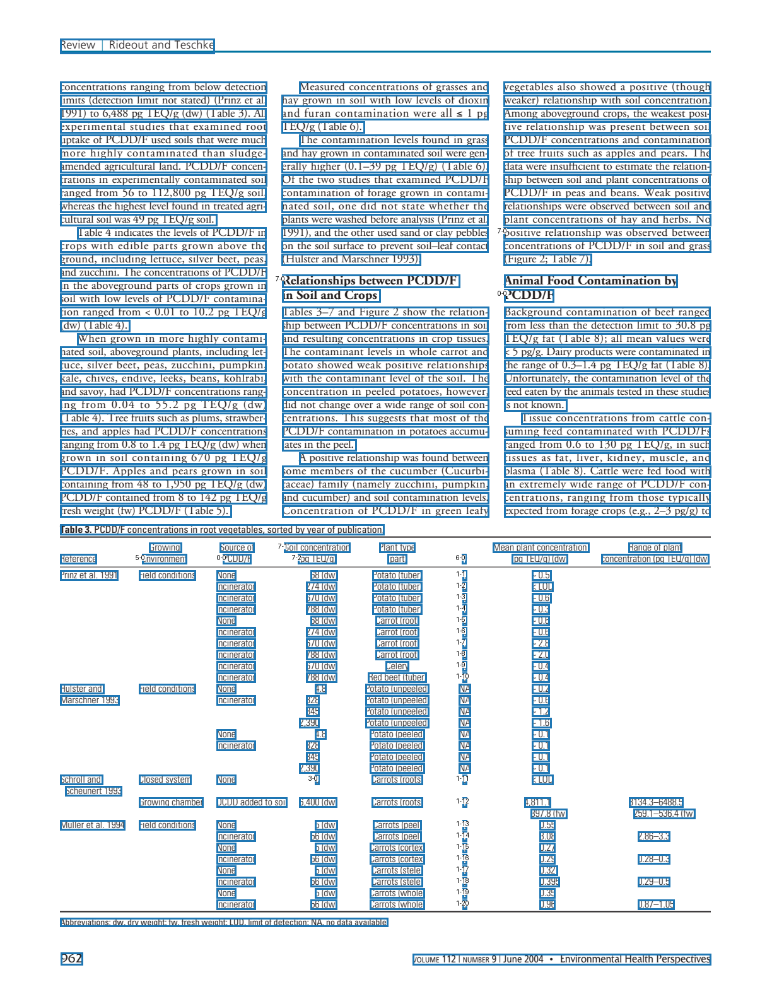

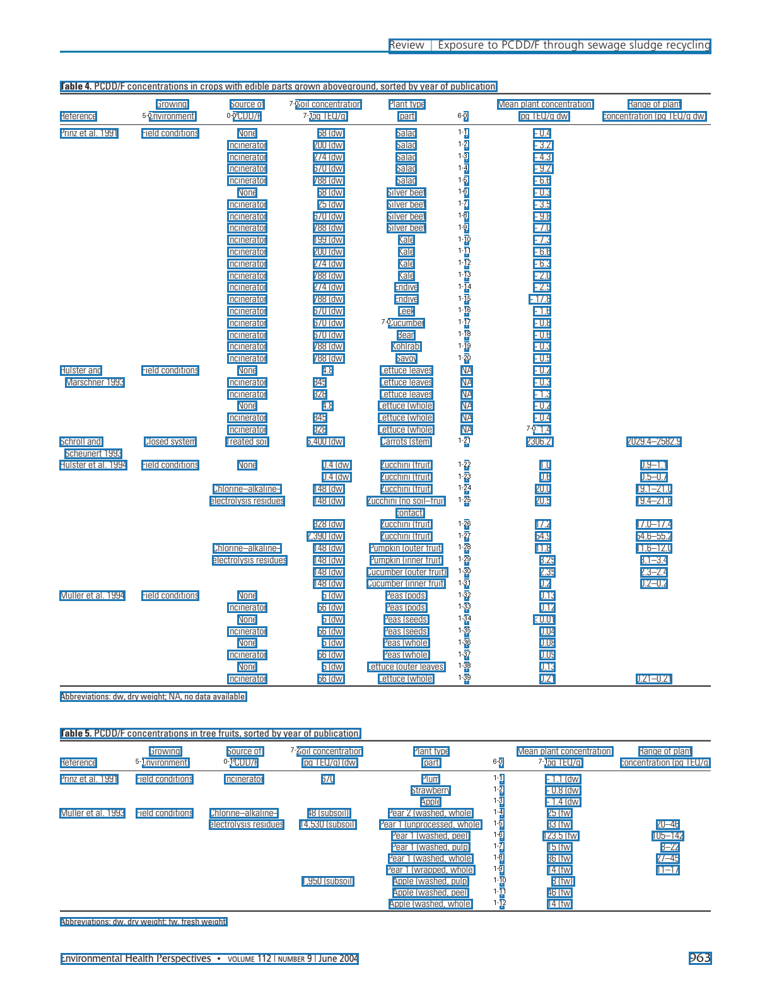

...

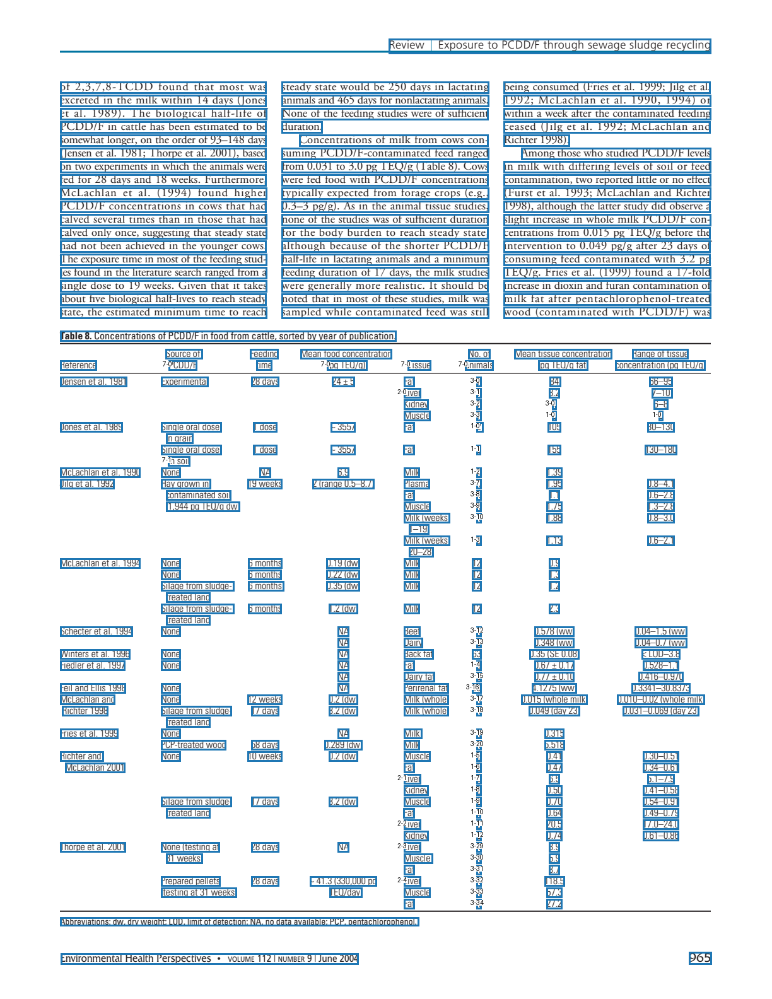

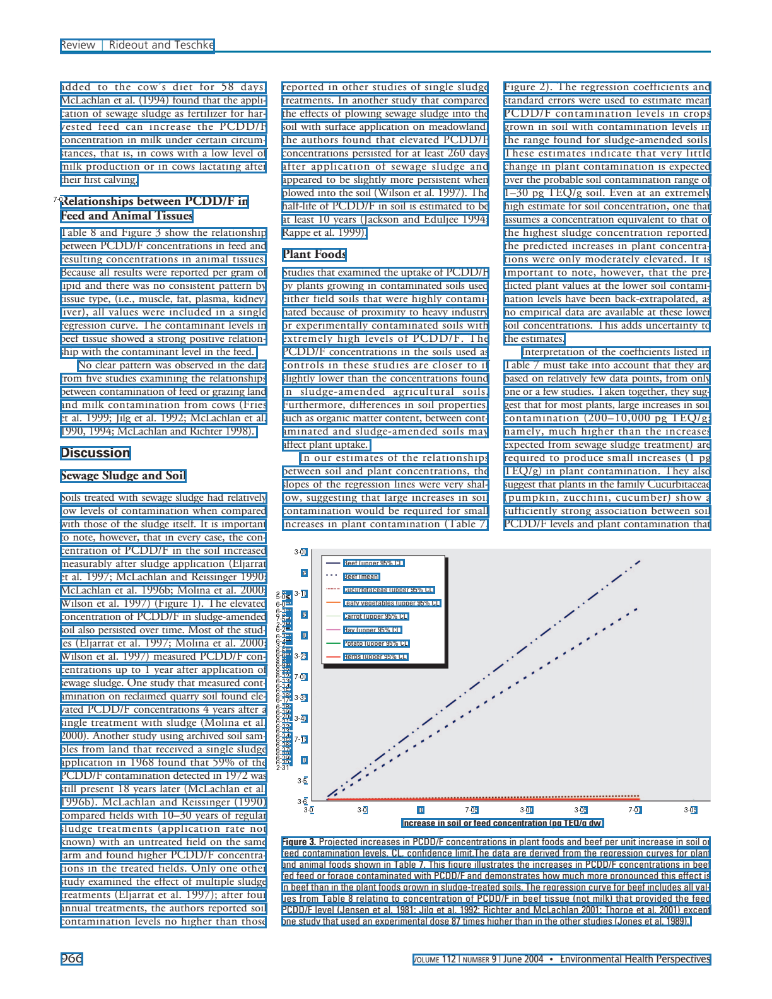

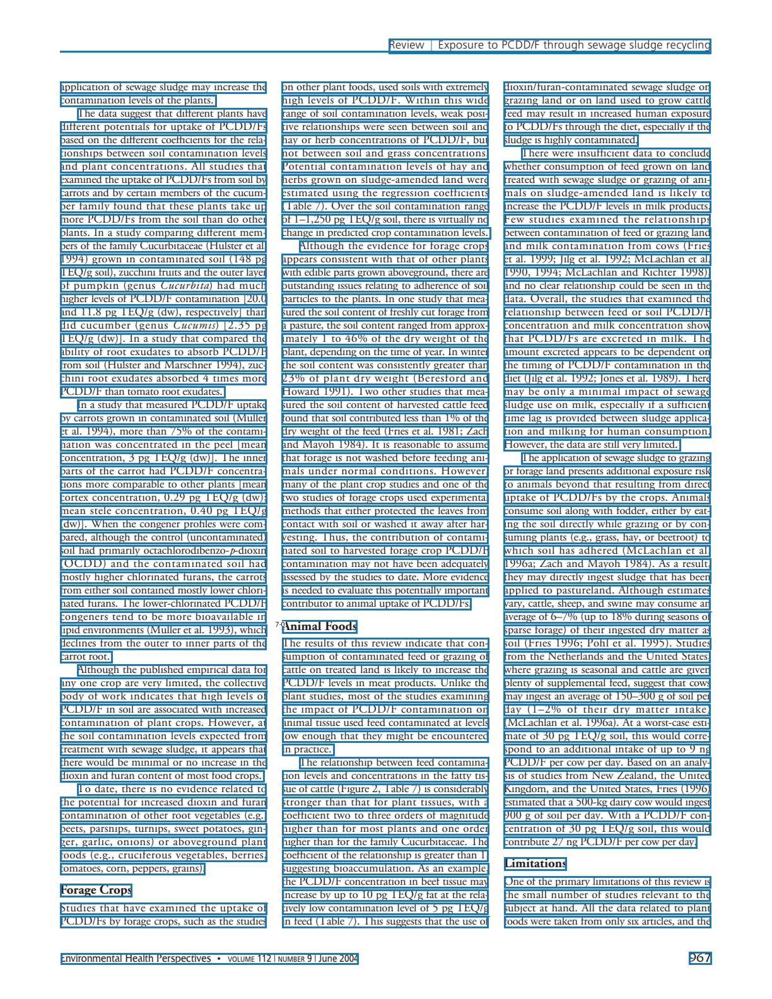

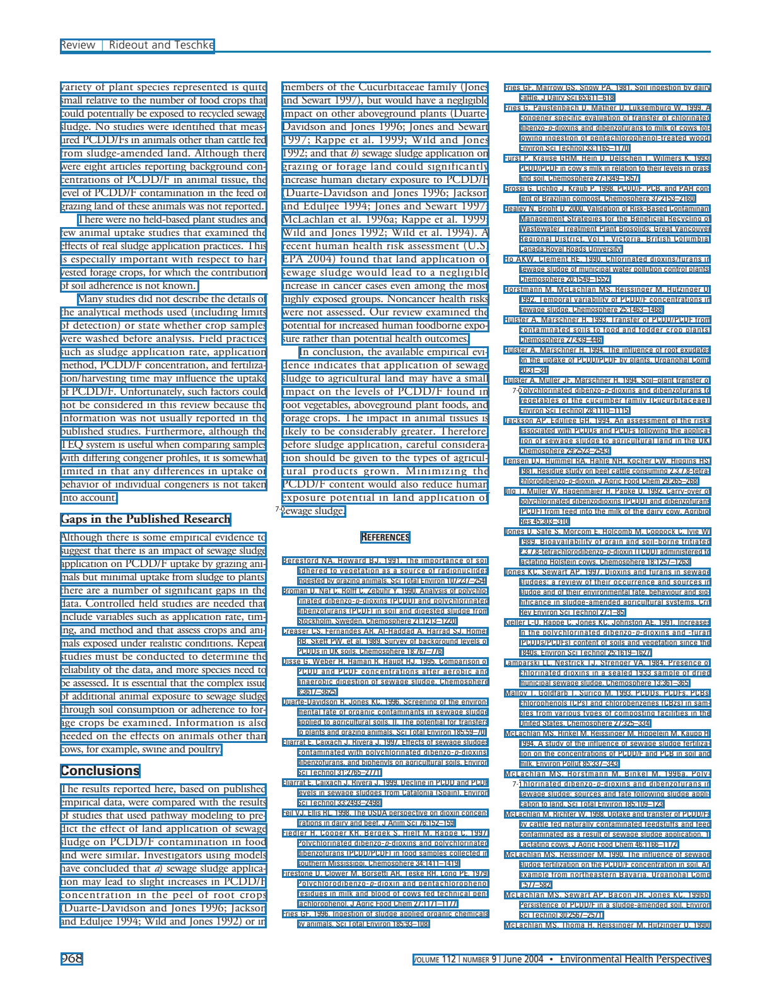

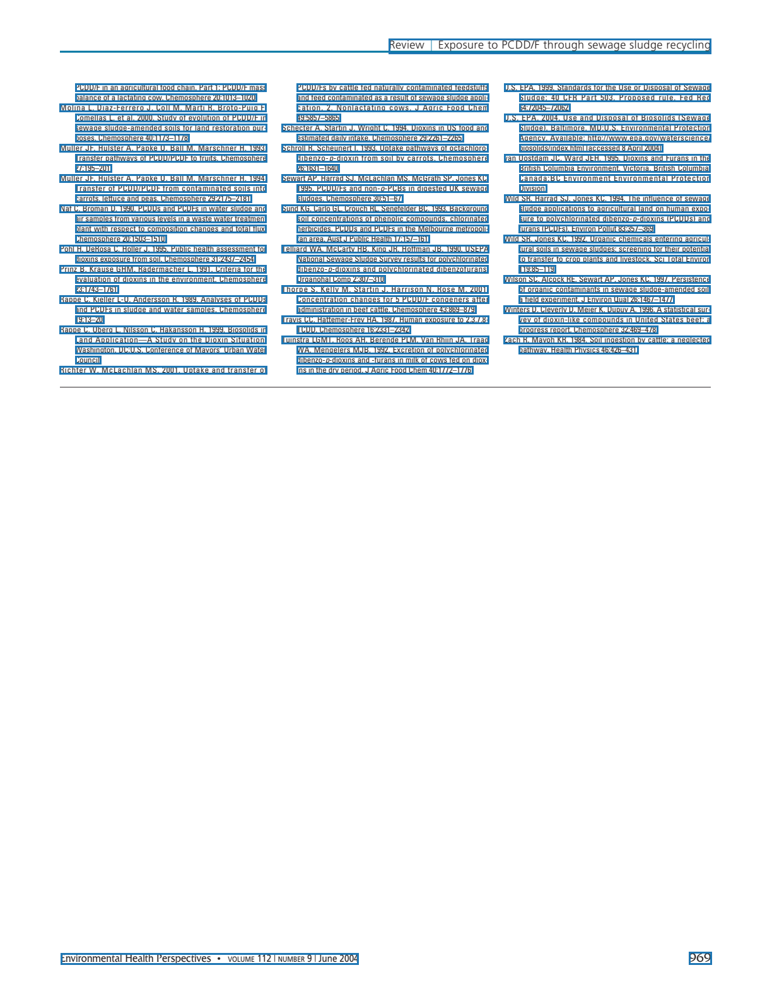

In [70]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)

In [223]:
# debug table-wrap query


# tous les textes
qtables='//*/table-wrap | //*/table-wrap'
qtables_2='//*/label | //*/caption | //*/th | //*/td | //*/fn'
# printXPath(tree,qtables)

try:
    r=elementpath.select(tree, qtables)
    for i,x in enumerate(r):
        print(f'\nTable {i}\n')
        # printXML(x)
        print(f'type tree{type(tree)} <> type x {type(x)}')
        r2=elementpath.select(x, qtables_2)
        for i2,x2 in enumerate(r2):
            print(i2, ':', "".join(x2.itertext()))
        break # just one table
except:
    print(f"error in expression ({qtables}) ({qtables_2}) or inputfile")


Table 0

type tree<class 'lxml.etree._ElementTree'> <> type x <class 'lxml.etree._Element'>
0 : Table 1
1 : Concentrations of PCDD/F in sewage sludge, sorted by country and year.
2 : Reference
3 : Country
4 : Year
5 : Source of material
6 : n
7 : Mean concentration (pg TEQ/g)
8 : Range (pg TEQ/g)
9 : Ho and Clement 1990
10 : Canada
11 : 1986
12 : Treated municipal sludge
13 : 50
14 : NA
15 : 0.0005–0.0015
16 : 
17 : 
18 : 
19 : Raw municipal sludge
20 : 50
21 : NA
22 : 0.0026–0.0051
23 : van Oostdam and Ward 1995
24 : Canada
25 : 1990–1993
26 : Primary sludge
27 : 4
28 : 16.6 (dw)
29 : 2.3–49.6
30 : Healey and Bright 2000
31 : Canada
32 : 1998–1999
33 : Municipal wastewater treatment plants
34 : 26
35 : 40 (dw)
36 : 5.6–250
37 : Lamparski et al. 1984
38 : USA
39 : 1933
40 : Treated municipal sludge
41 : 1
42 : 87.7 (dw)
43 : 
44 : 
45 : 
46 : 1981
47 : Treated municipal sludge
48 : 1
49 : 88.9 (dw)
50 : 
51 : 
52 : 
53 : 1982
54 : Treated municipal sludge
55 : 1
56 : 80.8 (dw)
57 : 
5

In [212]:
# debug
# Not matched text boxes 


print(f'Nb text boxes not matched: {len(map_tboxes)}')

for tb in [v for _,v in map_tboxes.items()]:
    print(tb.page_num, f'{(tb.y0):.2f}', tb.text)

Nb text boxes not matched: 1331
0 0.03 Research | Review
0 0.08 Potential for Increased Human Foodborne Exposure to PCDD/F When
0 0.10 Recycling Sewage Sludge on Agricultural Land
0 0.12 Karen Rideout1,2 and Kay Teschke1,3
0 0.14 1School of Occupational and Environmental Hygiene, 2Institute for Resources, Environment and Sustainability, and 3Department of
0 0.16 Health Care and Epidemiology, University of British Columbia, Vancouver, British Columbia, Canada
0 0.44 likely to result in increased human exposure to PCDD/F. Key words: agriculture, bioaccumula-
0 0.45 tion, biosolids, dioxins, exposure assessment, food chain, furans, land recycling, PCDD/F, plant
0 0.47 uptake, sewage sludge. Environ Health Perspect 112:959–969 (2004). doi:10.1289/ehp.6802
0 0.48 available via http://dx.doi.org/ [Online 26 April 2004]
0 0.76 Address correspondence to K. Rideout, Institute for
0 0.77 Resources, Environment and Sustainability,
0 0.78 University of British Columbia, 2206 East Mall,
0 0.79 Room